In [ ]:
# do PCA analysis here:
# per subj per contrast construct a 5x400 matrix (activity per parcel per session)
# mean center within each parcel

In [1]:
import os
import numpy as np
import pandas as pd
import nibabel as nib
import nilearn
import json
import datetime
import pickle
import seaborn as sns
import gc
import psutil
import math
import scipy.stats as stats
from matplotlib.patches import Patch
from nilearn import plotting
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import threshold_stats_img
from nilearn.image import concat_imgs, mean_img, index_img
from nilearn.reporting import make_glm_report
from nilearn import masking, image
from nilearn import datasets
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from collections import defaultdict
from nilearn.maskers import NiftiLabelsMasker
from nilearn.plotting.find_cuts import find_cut_slices
import nibabel as nib


# Import shared utilities and configuration
# need to do it this way because in a sub-directory (later turn config and utils into part of a package)
from utils import (
    TASKS, CONTRASTS, SUBJECTS, SESSIONS, ENCOUNTERS,
    build_first_level_contrast_map_path, is_valid_contrast_map, clean_z_map_data,
    convert_to_regular_dict, create_smor_atlas,load_smor_atlas, load_schaefer_atlas, cleanup_memory
)
from config import BASE_DIR, OUTPUT_DIRS

In [2]:
# smorgasbord stuff
SMORG_PARCELLATED_DIR = OUTPUT_DIRS["smor"]
smor_files = {'mean':f'discovery_parcel_indiv_mean_updated'}
smor_date_updated = '0111'
indices = [1,2,3]
# get smorgasbord atlas
smorgasbord_atlas = load_smor_atlas()
SMORG_IMG = smorgasbord_atlas.maps
SMORG_DATA = SMORG_IMG.get_fdata()

req_atlas = "smor"
main_dir = SMORG_PARCELLATED_DIR
main_files = smor_files
date_updated = smor_date_updated
atlas_obj = smorgasbord_atlas
atlas_img = SMORG_IMG
atlas_data = SMORG_DATA

Loading Smorgasbord atlas...
Atlas loaded with 429 regions
Atlas shape: (193, 229, 193)


In [3]:
# file loading
file_type = "default" # can change to "default" to make this code use betas
output_ending = "_betas"
if (file_type == "z"):
    output_ending = "_z_scored"
        
# Load mean parcel data from multiple files
mean_filename = f"{main_dir}/{main_files['mean']}_{date_updated}"

In [4]:
# load the individual trajectories and data
indiv_dict_file = f'{mean_filename}{output_ending}_indiv_slopes.pkl'
with open(indiv_dict_file, 'rb') as f:
    indiv_parcel_traj_results = pickle.load(f)
    
print(f"\nTotal subjects loaded: {len(indiv_parcel_traj_results)}")
print(f"Atlas: {req_atlas} ({len(atlas_obj.labels)} regions)")


Total subjects loaded: 5
Atlas: smor (429 regions)


In [5]:
# verify numbers for each
for subj in SUBJECTS:
    count = 0
    
    for task in indiv_parcel_traj_results[subj].keys():
        for contrast in indiv_parcel_traj_results[subj][task].keys():
            count += 1
    print(f"for {subj} there are {count} specific task/contrast combos loaded")

for sub-s03 there are 40 specific task/contrast combos loaded
for sub-s10 there are 40 specific task/contrast combos loaded
for sub-s19 there are 40 specific task/contrast combos loaded
for sub-s29 there are 40 specific task/contrast combos loaded
for sub-s43 there are 40 specific task/contrast combos loaded


In [6]:
# collate the data for the PCA:
# dict where per task per contrast there is a 400x5 subject dict

parcel_activations = defaultdict(#task
        lambda: defaultdict(#contrast
            lambda: defaultdict(#subj
                lambda: defaultdict(#parcel
                    lambda: defaultdict(list)
                    )
            )
        )
)

# NOTE: some subjects have the last one missing; for now going to give those missing encounters the mean parcel value (which shouldn't impact the variance associated with each PC)
for subj in indiv_parcel_traj_results.keys():
    for task in indiv_parcel_traj_results[subj].keys():
        for contrast in indiv_parcel_traj_results[subj][task].keys():
            for parcel in indiv_parcel_traj_results[subj][task][contrast].keys():
                trajectory = indiv_parcel_traj_results[subj][task][contrast][parcel]["trajectory"]
                encounters_included = indiv_parcel_traj_results[subj][task][contrast][parcel]["encounters_included"]
                
                # Store both trajectory and which encounters are present
                parcel_activations[task][contrast][subj][parcel] = {
                    'trajectory': trajectory,
                    'encounters_included': encounters_included
                }

In [7]:
def construct_pca_matrix(parcel_activations, task, contrast, subj, n_sessions=5):
    """
    Construct a (5 sessions × 400 parcels) matrix for PCA.
    Missing sessions are imputed with the parcel's mean across available sessions.
    
    Returns:
    --------
    Y : np.array, shape (n_sessions, n_parcels)
    missing_mask : np.array, shape (n_sessions, n_parcels)
        Boolean mask indicating which values were imputed (True = imputed)
    """
    parcels = sorted(parcel_activations[task][contrast][subj].keys())
    n_parcels = len(parcels)
    
    Y = np.full((n_sessions, n_parcels), np.nan)
    missing_mask = np.zeros((n_sessions, n_parcels), dtype=bool)
    
    for p_idx, parcel in enumerate(parcels):
        data = parcel_activations[task][contrast][subj][parcel]
        trajectory = data['trajectory']
        encounters_included = data['encounters_included']
        
        # encounters_included is 1-indexed (e.g., [1, 2, 3, 4, 5])
        # Convert to 0-indexed for array placement
        session_indices = np.array(encounters_included) - 1
        
        # Place observed values
        Y[session_indices, p_idx] = trajectory
        
        # Impute missing with mean of observed
        if len(trajectory) < n_sessions:
            parcel_mean = np.mean(trajectory)
            missing_sessions = np.isnan(Y[:, p_idx])
            Y[missing_sessions, p_idx] = parcel_mean
            missing_mask[missing_sessions, p_idx] = True
    
    return Y, missing_mask

In [8]:
def run_session_pca(Y, n_components=3):
    """
    Run PCA on session × parcel matrix. (how do sessions differ based on their parcel patterns)
    This function mean centers across the parcel
    
    Parameters:
    -----------
    Y : np.array, shape (n_sessions, n_parcels)
    n_components : int
        Number of PCs to retain (default: 2)
    
    Returns:
    --------
    results : dict with keys:
        - 'pc_scores': (n_sessions, n_components) - session loadings on PCs
        - 'pc_loadings': (n_parcels, n_components) - parcel loadings on PCs
        - 'explained_variance_ratio': (n_components,)
        - 'Y_centered': mean-centered data used for PCA
        - 'parcel_means': means removed from each parcel
    """
    # Mean-center each parcel (column) across sessions
    parcel_means = np.mean(Y, axis=0)
    Y_centered = Y - parcel_means  # (5, 400)
    
    # Run PCA
    pca = PCA(n_components=n_components)
    pc_scores = pca.fit_transform(Y_centered)  # (5, n_components)
    
    results = {
        'pc_scores': pc_scores,  # How much each session loads on each PC
        'pc_loadings': pca.components_.T,  # (n_parcels, n_components) - how much each parcel contributes
        'explained_variance_ratio': pca.explained_variance_ratio_,
        'Y_centered': Y_centered,
        'parcel_means': parcel_means,
        'pca_object': pca
    }
    
    return results

In [9]:
pca_results = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for task in parcel_activations.keys():
    for contrast in parcel_activations[task].keys():
        for subj in parcel_activations[task][contrast].keys():
            
            # Construct matrix
            Y, missing_mask = construct_pca_matrix(
                parcel_activations, task, contrast, subj
            )
            
            # Check if too much missing data
            percent_missing = 100 * missing_mask.sum() / missing_mask.size
            if (percent_missing > 0):
                print(f"{subj}/{task}/{contrast}: {percent_missing:.1f}% imputed")
            
            if percent_missing > 20:  # Optional threshold
                print(f"MORE THAN ONE ENCOUNTER IS MISSING.")
            
            # Run PCA
            pca_res = run_session_pca(Y, n_components=4)
            
            # Store results
            pca_results[task][contrast][subj] = {
                **pca_res,
                'missing_mask': missing_mask,
                'percent_missing': percent_missing,
                'Y_raw': Y
            }
            
            print(f"{subj}/{task}/{contrast}: PC1 explains {pca_res['explained_variance_ratio'][0]:.1%} of variance")
            print(f"{subj}/{task}/{contrast}: PC2 explains {pca_res['explained_variance_ratio'][1]:.1%} of variance")
            print(f"{subj}/{task}/{contrast}: PC3 explains {pca_res['explained_variance_ratio'][2]:.1%} of variance")
            print(f"{subj}/{task}/{contrast}: PC4 explains {pca_res['explained_variance_ratio'][3]:.1%} of variance")

sub-s03/nBack/twoBack-oneBack: PC1 explains 65.7% of variance
sub-s03/nBack/twoBack-oneBack: PC2 explains 17.1% of variance
sub-s03/nBack/twoBack-oneBack: PC3 explains 11.6% of variance
sub-s03/nBack/twoBack-oneBack: PC4 explains 5.7% of variance
sub-s10/nBack/twoBack-oneBack: PC1 explains 76.4% of variance
sub-s10/nBack/twoBack-oneBack: PC2 explains 10.8% of variance
sub-s10/nBack/twoBack-oneBack: PC3 explains 6.6% of variance
sub-s10/nBack/twoBack-oneBack: PC4 explains 6.2% of variance
sub-s19/nBack/twoBack-oneBack: PC1 explains 43.5% of variance
sub-s19/nBack/twoBack-oneBack: PC2 explains 26.4% of variance
sub-s19/nBack/twoBack-oneBack: PC3 explains 18.4% of variance
sub-s19/nBack/twoBack-oneBack: PC4 explains 11.6% of variance
sub-s29/nBack/twoBack-oneBack: PC1 explains 55.2% of variance
sub-s29/nBack/twoBack-oneBack: PC2 explains 20.6% of variance
sub-s29/nBack/twoBack-oneBack: PC3 explains 16.7% of variance
sub-s29/nBack/twoBack-oneBack: PC4 explains 7.4% of variance
sub-s43/nBac

In [10]:
def compute_pc_rsms(pc_scores):
    """Compute RSMs from session x PC scores. Returns dict: PC1, PC2, ..., all_PCs."""
    n_sessions, n_components = pc_scores.shape
    rsms = {}
    for k in range(n_components):
        rsms["PC%d" % (k + 1)] = np.outer(pc_scores[:, k], pc_scores[:, k])
    rsms["all_PCs"] = np.corrcoef(pc_scores)
    return rsms

def plot_rsms_for_task_contrast(pca_results, task, contrast, subj, session_labels=None,
                                figsize_per_panel=(3.5, 3), save_path=None):
    """Plot RSMs for each PC and combined for one subject/task/contrast."""
    if session_labels is None:
        n_sessions = pca_results[task][contrast][subj]["pc_scores"].shape[0]
        session_labels = [str(i + 1) for i in range(n_sessions)]
    pc_scores = pca_results[task][contrast][subj]["pc_scores"]
    rsms = compute_pc_rsms(pc_scores)
    n_components = pc_scores.shape[1]
    n_panels = n_components + 1
    fig, axes = plt.subplots(1, n_panels, figsize=(figsize_per_panel[0] * n_panels, figsize_per_panel[1]))
    if n_panels == 1:
        axes = [axes]
    keys = ["PC%d" % (k + 1) for k in range(n_components)] + ["all_PCs"]
    titles = keys[:-1] + ["All PCs (corr)"]
    for ax, key, title in zip(axes, keys, titles):
        r = rsms[key]
        im = ax.imshow(r, cmap="RdBu_r", aspect="equal", vmin=np.nanmin(r), vmax=np.nanmax(r))
        ax.set_xticks(range(len(session_labels)))
        ax.set_yticks(range(len(session_labels)))
        ax.set_xticklabels(session_labels)
        ax.set_yticklabels(session_labels)
        ax.set_xlabel("Session number")
        ax.set_ylabel("Session number")
        ax.set_title(title)
        plt.colorbar(im, ax=ax, shrink=0.7)
    fig.suptitle("%s / %s / %s" % (subj, task, contrast), fontsize=11, y=1.02)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        plt.close(fig)
    else:
        plt.show()


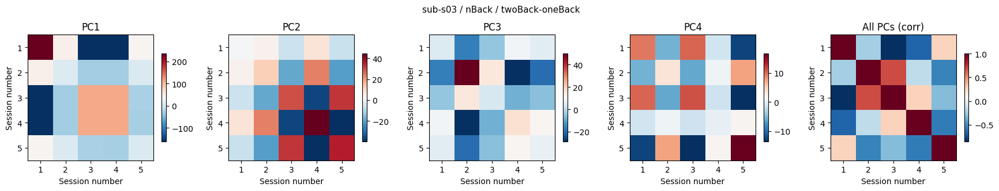

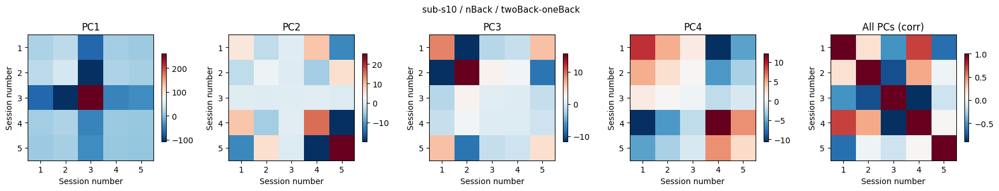

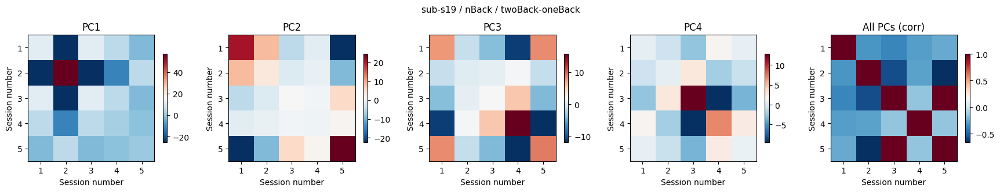

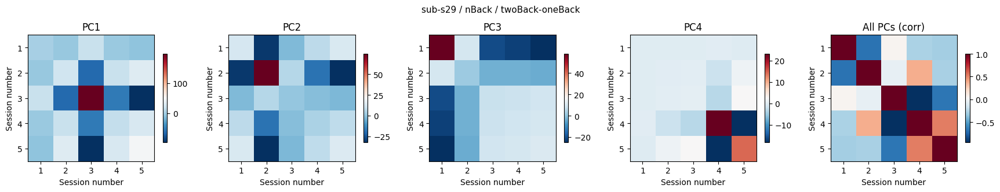

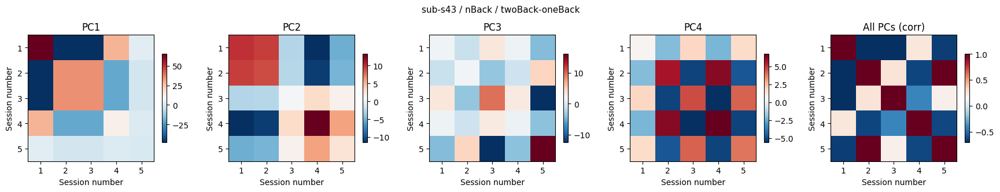

...

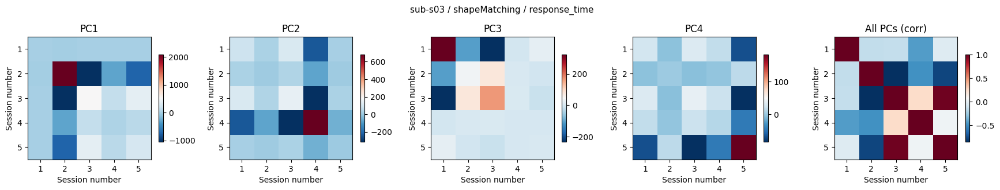

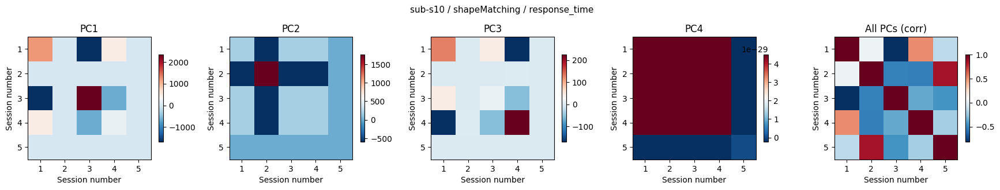

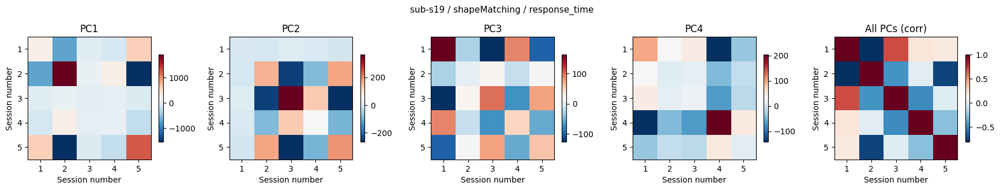

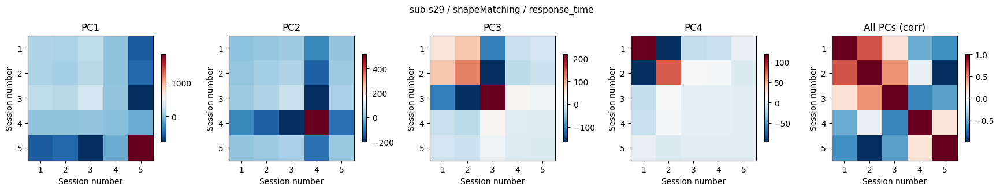

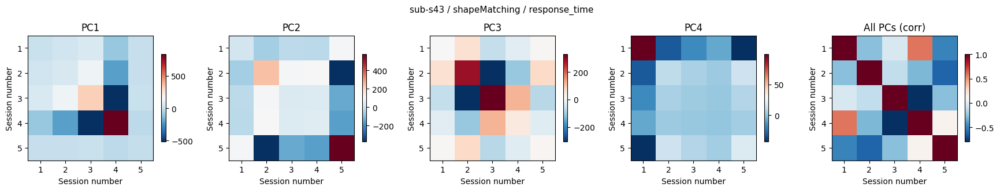

KeyboardInterrupt: 

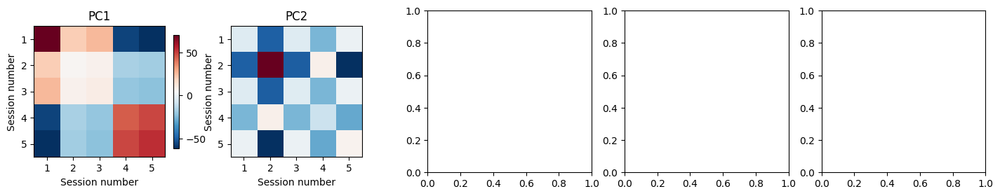

In [11]:
# Plot RSMs for each PC for every subject and every task/contrast
# Option 1: save all figures to a directory (recommended; many combinations)
# Option 2: set save_rsm_figures = False and restrict to one subject/task to display inline

save_rsm_figures = False  # set False to show plots inline for subset below
rsm_out_dir = os.path.join(BASE_DIR, "rsm_pc_plots")
if save_rsm_figures:
    os.makedirs(rsm_out_dir, exist_ok=True)

for task in pca_results.keys():
    for contrast in pca_results[task].keys():
        for subj in pca_results[task][contrast].keys():
            if "pc_scores" not in pca_results[task][contrast][subj]:
                continue
            if save_rsm_figures:
                safe_task = task.replace(" ", "_")
                safe_contrast = contrast.replace(" ", "_").replace("/", "-")
                fname = f"rsm_{subj}_{safe_task}_{safe_contrast}.png"
                save_path = os.path.join(rsm_out_dir, fname)
            else:
                save_path = None
            plot_rsms_for_task_contrast(pca_results, task, contrast, subj, save_path=save_path)

if save_rsm_figures:
    print("RSM figures saved to:", rsm_out_dir)


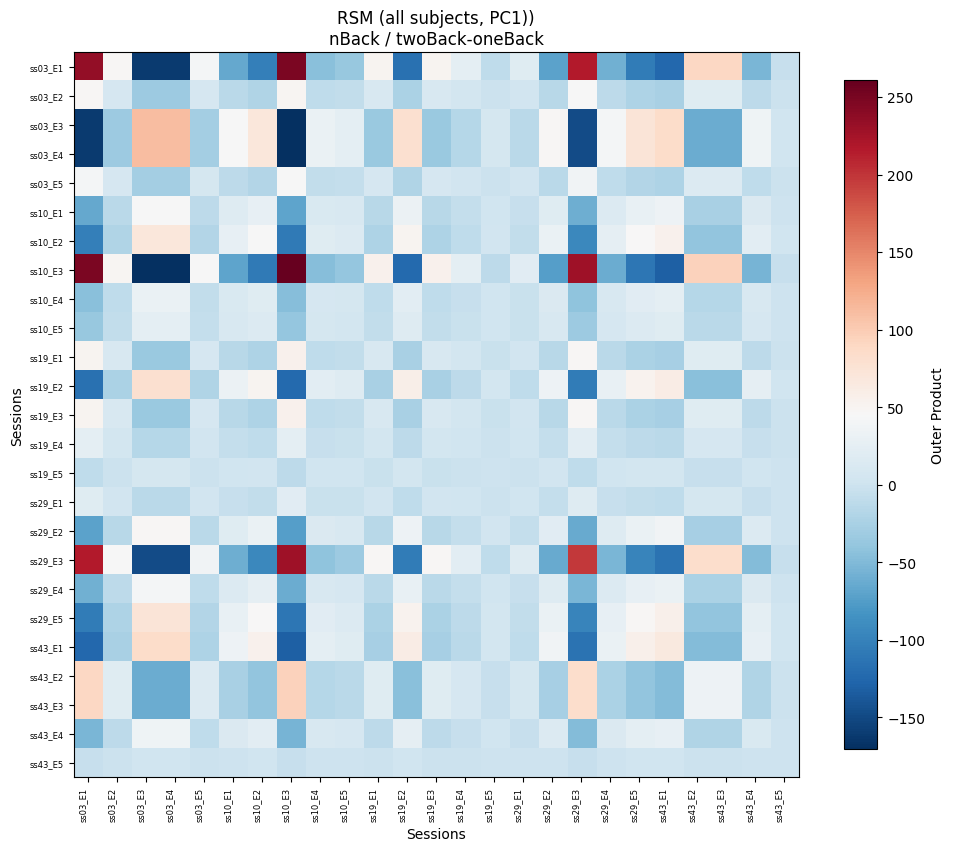

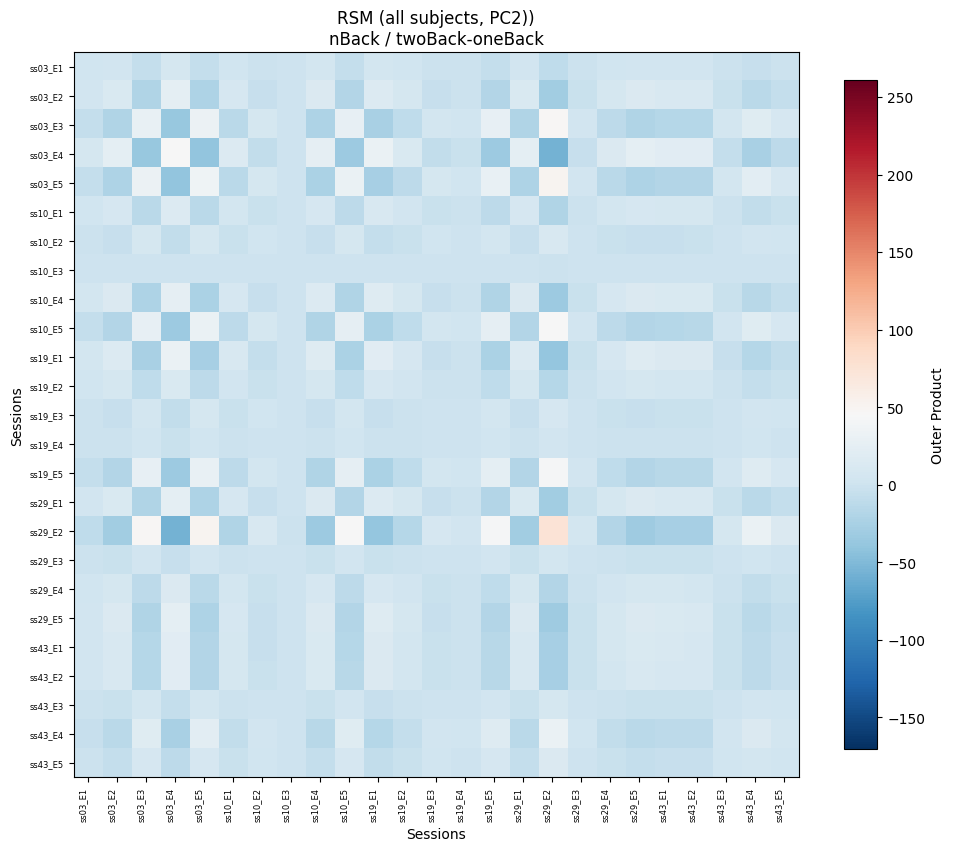

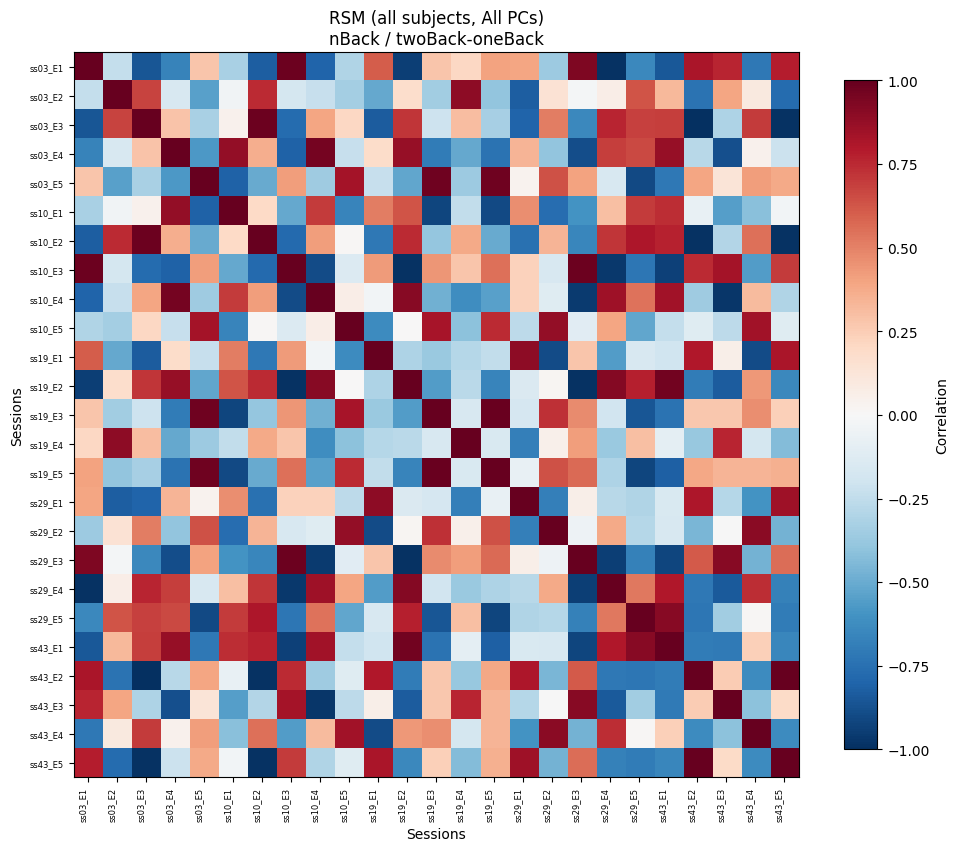

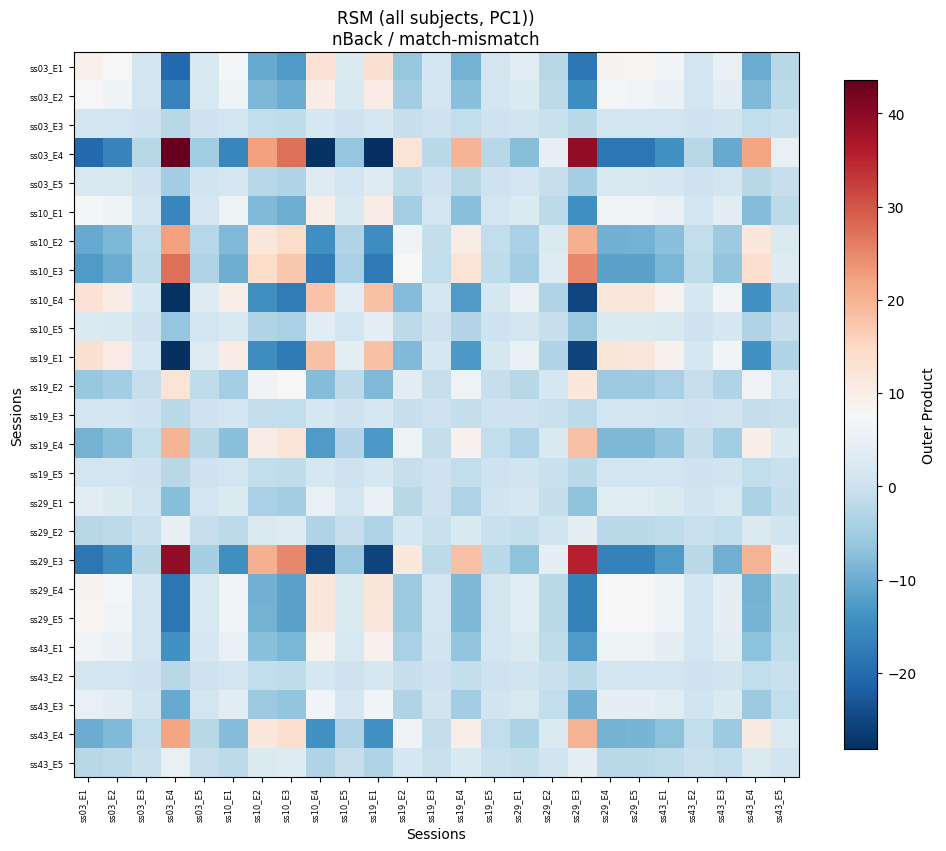

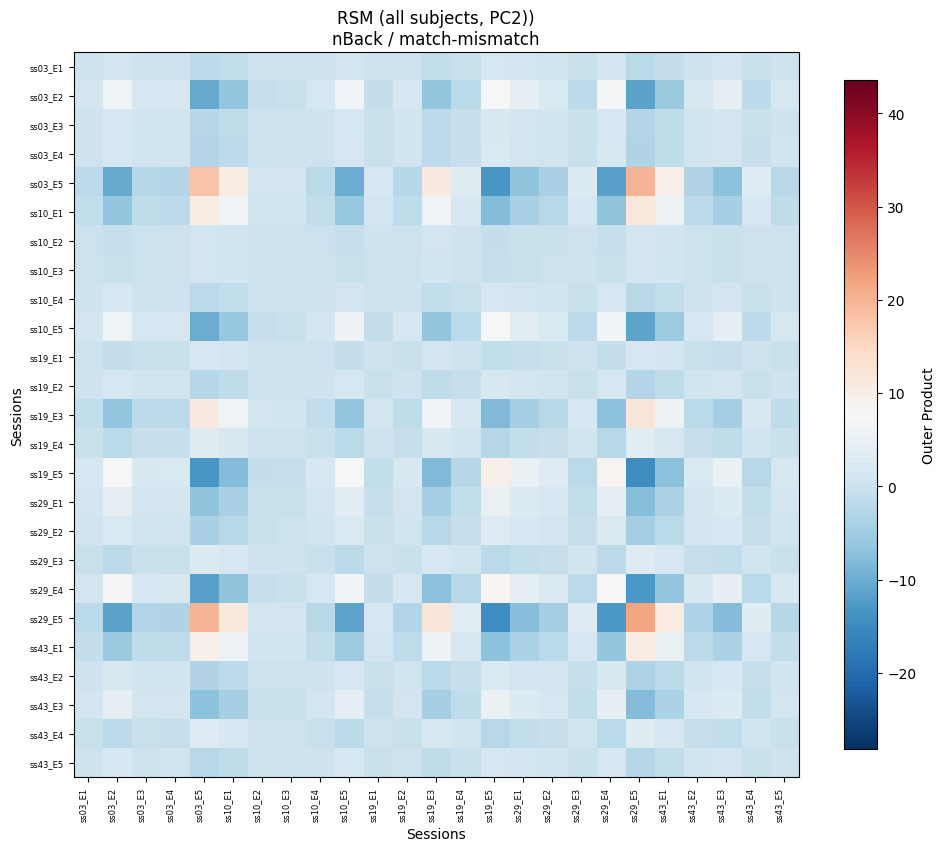

...

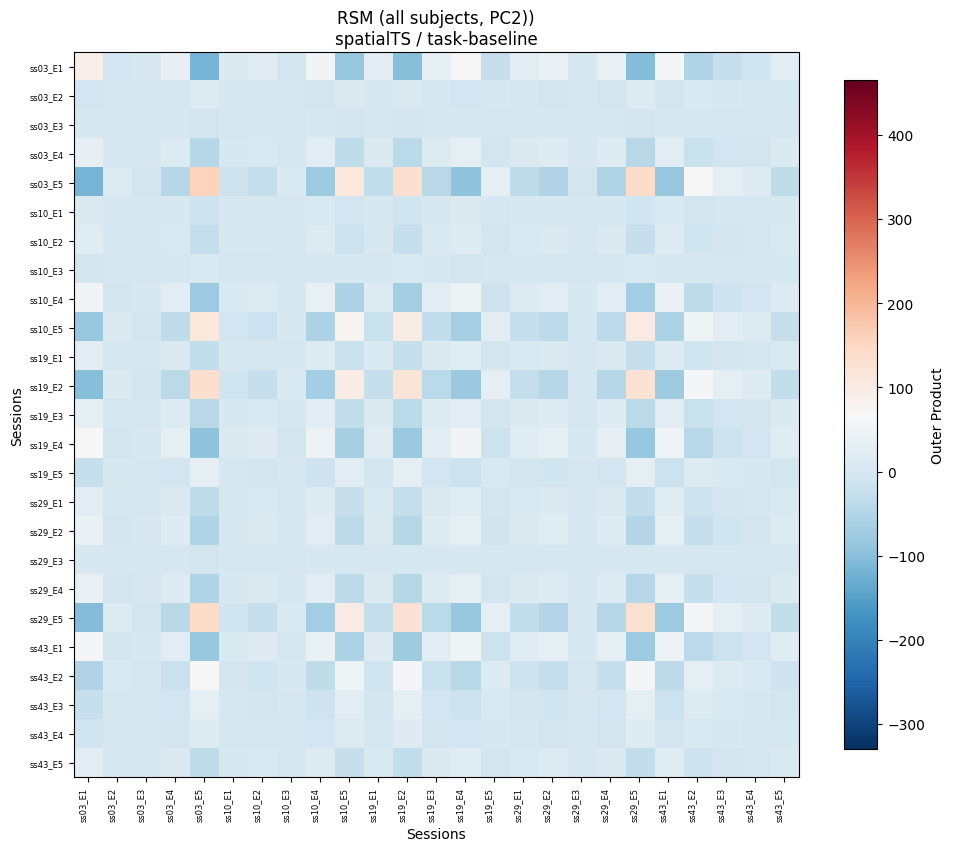

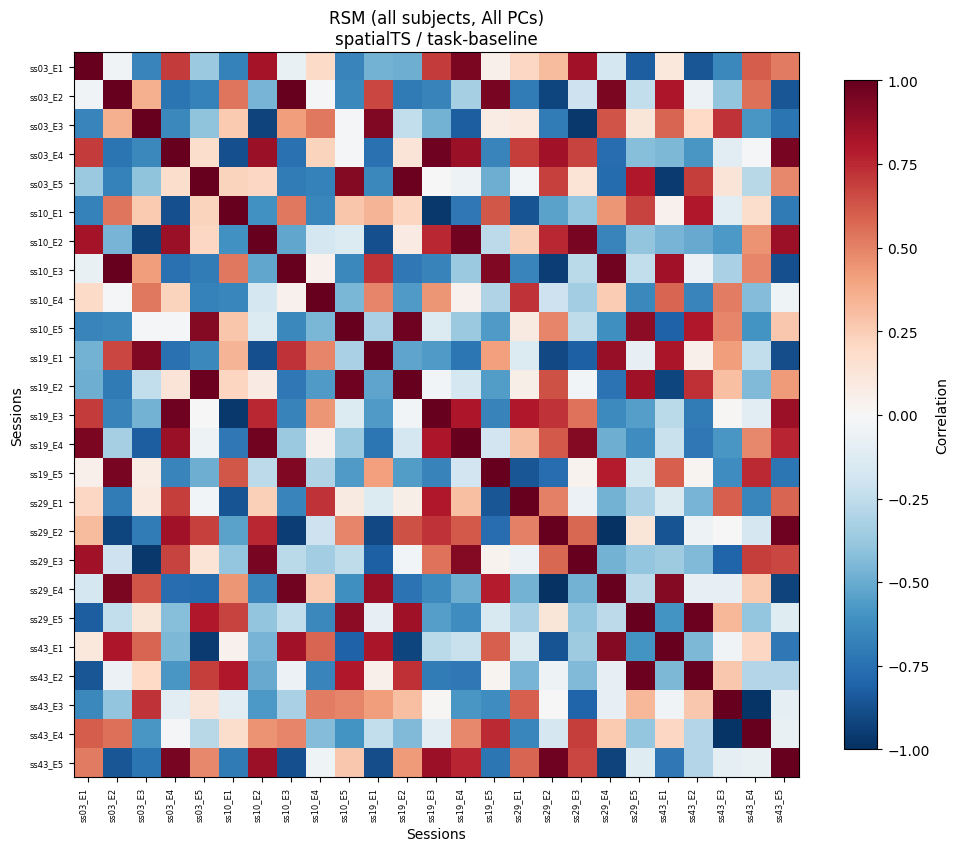

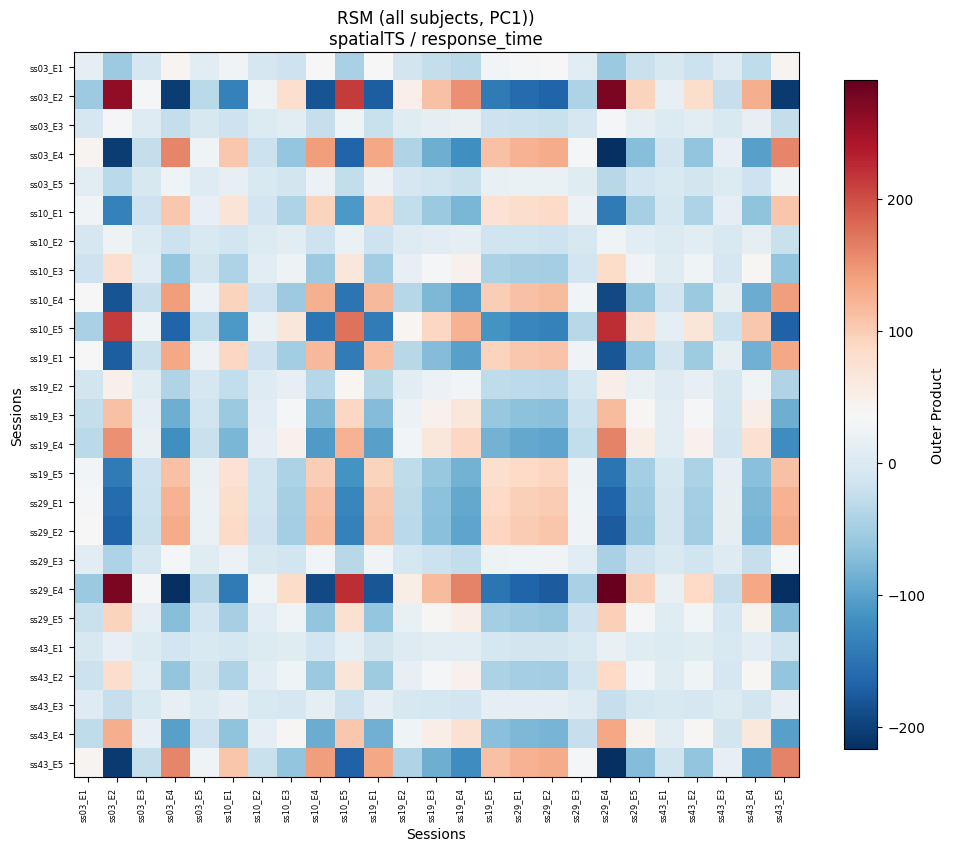

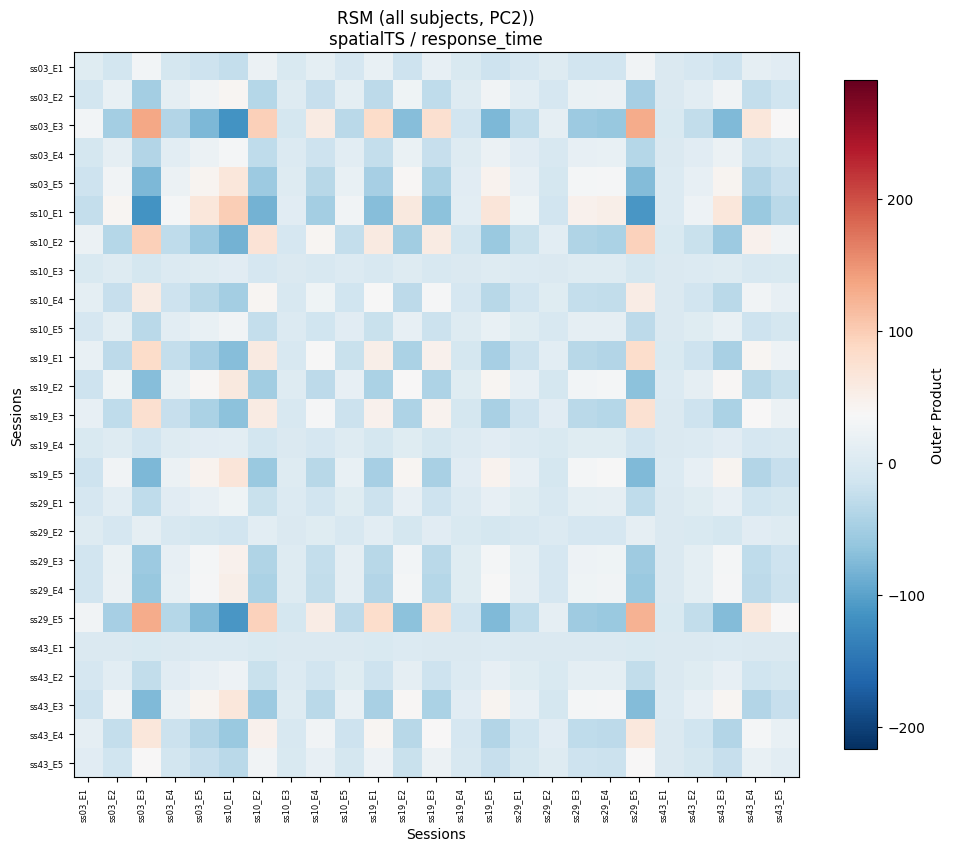

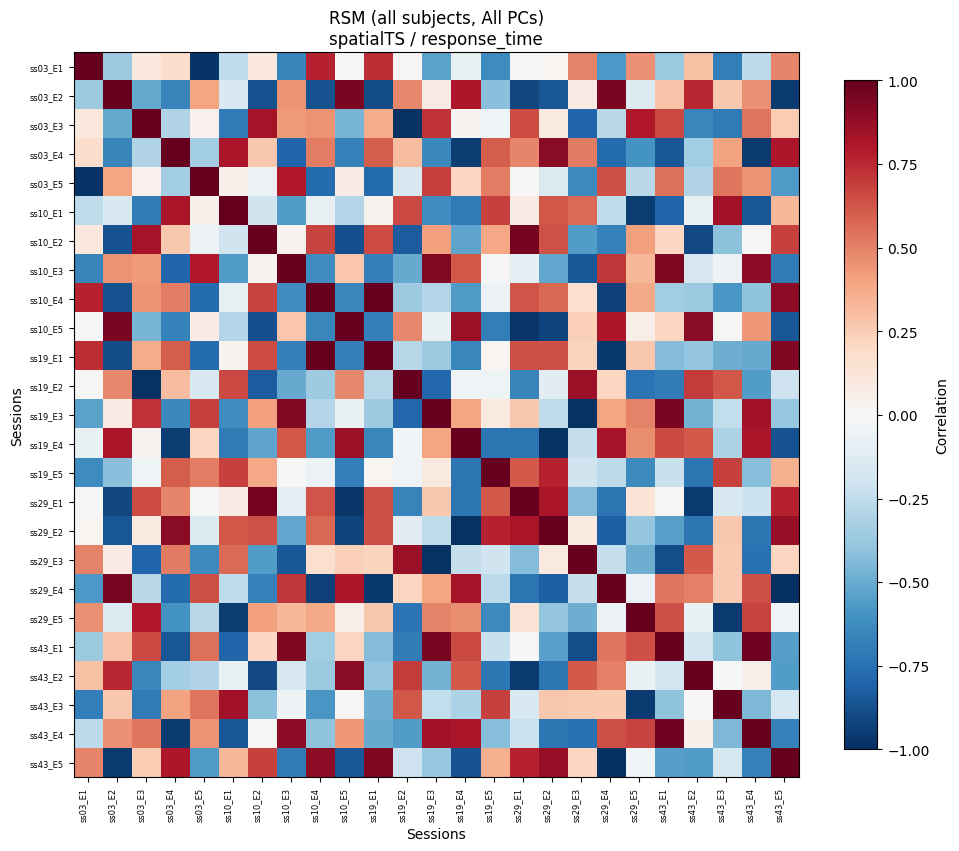

In [19]:
def build_stacked_pca_rsm_from_existing(pca_results, task, contrast, pc_index=None):
    """
    Stack PC scores from pre-computed PCA results for all subjects.
    
    Parameters:
    -----------
    pca_results : dict
    task : str
    contrast : str
    pc_index : int or None
        If None, use all PCs. If int, use only that PC (0-indexed).
    
    Returns RSM and condition labels without re-running PCA.
    """
    if task not in pca_results or contrast not in pca_results[task]:
        return None, None, None, None
    
    rows_list = []
    condition_labels = []
    
    for subj in pca_results[task][contrast].keys():
        pc_scores = pca_results[task][contrast][subj]["pc_scores"]
        short_subj = subj.replace('sub-', 's')
        
        for sess in range(pc_scores.shape[0]):
            if pc_index is not None:
                # Use only specified PC (1D array)
                rows_list.append(pc_scores[sess, pc_index])
            else:
                # Use all PCs
                rows_list.append(pc_scores[sess, :])
            condition_labels.append(f"{short_subj}_E{sess + 1}")
    
    if not rows_list:
        return None, None, None, None
    
    pc_scores_stacked = np.array(rows_list)
    
    if pc_scores_stacked.shape[0] < 2:
        return None, None, None, None
    
    # For single PC: use outer product
    # For multiple PCs: use correlation
    if pc_index is not None:
        # Single PC: outer product
        rsm = np.outer(pc_scores_stacked, pc_scores_stacked)
    else:
        # Multiple PCs: correlation
        rsm = np.corrcoef(pc_scores_stacked)
    
    # Get explained variance from first subject
    first_subj = list(pca_results[task][contrast].keys())[0]
    var_ratio = pca_results[task][contrast][first_subj]["explained_variance_ratio"]
    
    return rsm, condition_labels, pc_scores_stacked, var_ratio


def plot_combined_rsm(rsm, condition_labels, task, contrast, pc_label=None, var_ratio=None, 
                      is_outer_product=False, vmin=None, vmax=None, figsize=(10, 9), save_path=None):
    """Plot one big RSM (all subjects x sessions) for a task/contrast."""
    n = len(condition_labels)
    fig, ax = plt.subplots(figsize=figsize)
    
    # Use different scale for outer product vs correlation
    if is_outer_product:
        if vmin is None or vmax is None:
            vmin, vmax = np.nanmin(rsm), np.nanmax(rsm)
        label = 'Outer Product'
    else:
        vmin, vmax = -1, 1
        label = 'Correlation'
    
    im = ax.imshow(rsm, cmap='RdBu_r', aspect='equal', vmin=vmin, vmax=vmax)
    ax.set_xticks(range(n))
    ax.set_yticks(range(n))
    ax.set_xticklabels(condition_labels, rotation=90, ha='right', fontsize=6)
    ax.set_yticklabels(condition_labels, fontsize=6)
    ax.set_xlabel("Sessions")
    ax.set_ylabel("Sessions")
    
    title = f"RSM (all subjects, PC space)\n{task} / {contrast}"
    if pc_label:
        title = f"RSM (all subjects, {pc_label})\n{task} / {contrast}"
    ax.set_title(title)
    
    plt.colorbar(im, ax=ax, shrink=0.8, label=label)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.close(fig)
    else:
        plt.show()


# Use pre-computed PCA results
save_combined_rsm = False
combined_rsm_out_dir = os.path.join(BASE_DIR, "rsm_combined_pc_plots")
if save_combined_rsm:
    os.makedirs(combined_rsm_out_dir, exist_ok=True)

for task in pca_results.keys():
    for contrast in pca_results[task].keys():
        # Get number of components from first subject
        first_subj = list(pca_results[task][contrast].keys())[0]
        n_components = pca_results[task][contrast][first_subj]["pc_scores"].shape[1]
        
        # First pass: compute global min/max for outer products
        all_rsms = []
        for pc_idx in range(n_components):
            rsm, labels, pc_scores, var_ratio = build_stacked_pca_rsm_from_existing(
                pca_results, task, contrast, pc_index=pc_idx
            )
            if rsm is not None:
                all_rsms.append(rsm)
        
        if all_rsms:
            global_vmin = min(np.nanmin(r) for r in all_rsms)
            global_vmax = max(np.nanmax(r) for r in all_rsms)
        else:
            global_vmin, global_vmax = None, None
        
        # Second pass: plot with consistent scale
        # for pc_idx in range(n_components):
        for pc_idx in range(2):
            rsm, labels, pc_scores, var_ratio = build_stacked_pca_rsm_from_existing(
                pca_results, task, contrast, pc_index=pc_idx
            )
            if rsm is None:
                continue
            
            save_path = None
            if save_combined_rsm:
                safe_task = task.replace(" ", "_")
                safe_contrast = contrast.replace(" ", "_").replace("/", "-")
                save_path = os.path.join(combined_rsm_out_dir, 
                                        f"rsm_combined_{safe_task}_{safe_contrast}_PC{pc_idx+1}.png")
            
            plot_combined_rsm(rsm, labels, task, contrast, 
                            pc_label=f"PC{pc_idx+1})", 
                            var_ratio=var_ratio, is_outer_product=True, 
                            vmin=global_vmin, vmax=global_vmax, save_path=save_path)
        
        # Also create combined RSM with all PCs
        rsm, labels, pc_scores, var_ratio = build_stacked_pca_rsm_from_existing(
            pca_results, task, contrast, pc_index=None
        )
        if rsm is not None:
            save_path = None
            if save_combined_rsm:
                safe_task = task.replace(" ", "_")
                safe_contrast = contrast.replace(" ", "_").replace("/", "-")
                save_path = os.path.join(combined_rsm_out_dir, 
                                        f"rsm_combined_{safe_task}_{safe_contrast}_AllPCs.png")
            
            total_var = sum(var_ratio)
            plot_combined_rsm(rsm, labels, task, contrast, 
                            pc_label=f"All PCs", 
                            var_ratio=var_ratio, is_outer_product=False, save_path=save_path)

if save_combined_rsm:
    print("Combined RSM figures saved to:", combined_rsm_out_dir)

# OLDER ANALYSES: more messy, fitting models to each PC

In [ ]:
def characterize_pc1_patterns(pca_results, task_of_interest = None):
    """
    Test whether PC1 captures linear session-to-session change.
    If PC1 = practice effects, pc_scores should correlate with session number.
    """
    results = []
    
    for task in pca_results.keys():
        if task_of_interest is not None:
            if task != task_of_interest:
                continue
        for contrast in pca_results[task].keys():
            for subj in pca_results[task][contrast].keys():
                
                pc_scores = pca_results[task][contrast][subj]['pc_scores']
                pc1_scores = pc_scores[:, 0]  # (5,) - one per session
                pc2_scores = pc_scores[:, 1]
                
                var_explained_pc1 = pca_results[task][contrast][subj]['explained_variance_ratio'][0]
                var_explained_pc2 = pca_results[task][contrast][subj]['explained_variance_ratio'][1]
                
                # Test if PC1 is linear with session number
                sessions = np.arange(1, 6)  # [1, 2, 3, 4, 5]
                
                # Correlation between PC1 and session number
                r_pc1, p_pc1 = stats.pearsonr(sessions, pc1_scores)
                
                # Also check PC2 (should be weaker/non-linear)
                r_pc2, p_pc2 = stats.pearsonr(sessions, pc2_scores)
                
                results.append({
                    'subject': subj,
                    'task': task,
                    'contrast': contrast,
                    'pc1_var_explained': var_explained_pc1,
                    'pc2_var_explained': var_explained_pc2,
                    'pc1_session_corr': r_pc1,  # If ~±1, PC1 is linear trend
                    'pc1_session_corr_p': p_pc1,
                    'pc2_session_corr_p': p_pc2,
                    'pc2_session_corr': r_pc2,
                    'pc1_scores': pc1_scores,
                    'pc2_scores': pc2_scores,
                })
    
    return pd.DataFrame(results)

# Summarize: Does PC1 typically capture linear trends?
print("FOR ALL TASKS:")
pc1_summary = characterize_pc1_patterns(pca_results)
print("PC1 characteristics across subjects:")
print(f"Mean variance explained by PC1: {pc1_summary['pc1_var_explained'].mean():.1%}")
print(f"Mean |correlation| with session: {pc1_summary['pc1_session_corr'].abs().mean():.2f}")
print(f"% with significant linear trend: {(pc1_summary['pc1_session_corr_p'] < 0.05).mean():.1%}")
print("PC2 characteristics across subjects:")
print(f"Mean variance explained by PC1: {pc1_summary['pc2_var_explained'].mean():.1%}")
print(f"Mean |correlation| with session: {pc1_summary['pc2_session_corr'].abs().mean():.2f}")
print(f"% with significant linear trend: {(pc1_summary['pc2_session_corr_p'] < 0.05).mean():.1%}")

for task in TASKS:
    print("------------------------------")
    print(f"FOR {task}:")
    temp_summary = characterize_pc1_patterns(pca_results, task)
    print("PC1 characteristics across subjects:")
    print(f"Mean variance explained by PC1: {temp_summary['pc1_var_explained'].mean():.1%}")
    print(f"Mean |correlation| with session: {temp_summary['pc1_session_corr'].abs().mean():.2f}")
    print(f"% with significant linear trend: {(temp_summary['pc1_session_corr_p'] < 0.05).mean():.1%}")
    print("PC2 characteristics across subjects:")
    print(f"Mean variance explained by PC1: {temp_summary['pc2_var_explained'].mean():.1%}")
    print(f"Mean |correlation| with session: {temp_summary['pc2_session_corr'].abs().mean():.2f}")
    print(f"% with significant linear trend: {(temp_summary['pc2_session_corr_p'] < 0.05).mean():.1%}")

In [ ]:
def characterize_pc_patterns_extended(pca_results):
    """
    Test whether PC1/PC2 capture various functional forms of session change.
    Tests: linear, quadratic, exponential decay, power law, logarithmic.
    """
    results = []
    
    for task in pca_results.keys():
        for contrast in pca_results[task].keys():
            for subj in pca_results[task][contrast].keys():
                
                pc_scores = pca_results[task][contrast][subj]['pc_scores']
                pc1_scores = pc_scores[:, 0]
                pc2_scores = pc_scores[:, 1]
                
                var_explained_pc1 = pca_results[task][contrast][subj]['explained_variance_ratio'][0]
                var_explained_pc2 = pca_results[task][contrast][subj]['explained_variance_ratio'][1]
                
                sessions = np.arange(1, 6)  # [1, 2, 3, 4, 5]
                
                # === PC1 Model Fitting ===
                pc1_fits = fit_multiple_models(sessions, pc1_scores)
                pc2_fits = fit_multiple_models(sessions, pc2_scores)
                
                results.append({
                    'subject': subj,
                    'task': task,
                    'contrast': contrast,
                    'pc1_var_explained': var_explained_pc1,
                    'pc2_var_explained': var_explained_pc2,
                    'pc1_scores': pc1_scores,
                    'pc2_scores': pc2_scores,
                    
                    # PC1 model fits
                    **{f'pc1_{k}': v for k, v in pc1_fits.items()},
                    
                    # PC2 model fits
                    **{f'pc2_{k}': v for k, v in pc2_fits.items()},
                })
    
    return pd.DataFrame(results)


def fit_multiple_models(x, y):
    """
    Fit multiple functional forms and return R² for each.
    
    Models tested:
    1. Linear: y = a + b*x
    2. Quadratic: y = a + b*x + c*x²
    3. Exponential decay: y = a + b*exp(-c*x)
    4. Power law: y = a * x^b
    5. Logarithmic: y = a + b*log(x)
    """
    
    results = {}
    
    # 1. Linear
    try:
        slope, intercept, r, p, se = stats.linregress(x, y)
        y_pred = slope * x + intercept
        r2_linear = r**2
        results['linear_r2'] = r2_linear
        results['linear_p'] = p
        results['linear_slope'] = slope
    except:
        results['linear_r2'] = np.nan
        results['linear_p'] = np.nan
        results['linear_slope'] = np.nan
    
    # 2. Quadratic
    try:
        coeffs = np.polyfit(x, y, deg=2)
        y_pred = np.polyval(coeffs, x)
        r2_quad = r2_score(y, y_pred)
        results['quadratic_r2'] = r2_quad
        results['quadratic_a'] = coeffs[0]  # x² coefficient
        results['quadratic_b'] = coeffs[1]  # x coefficient
    except:
        results['quadratic_r2'] = np.nan
        results['quadratic_a'] = np.nan
        results['quadratic_b'] = np.nan
    
    # 3. Exponential decay: y = a + b*exp(-c*x)
    try:
        def exp_decay(x, a, b, c):
            return a + b * np.exp(-c * x)
        
        # Initial guess
        p0 = [y[-1], y[0] - y[-1], 0.5]
        popt, _ = curve_fit(exp_decay, x, y, p0=p0, maxfev=5000)
        y_pred = exp_decay(x, *popt)
        r2_exp = r2_score(y, y_pred)
        results['exp_decay_r2'] = r2_exp
        results['exp_decay_rate'] = popt[2]  # decay rate
    except:
        results['exp_decay_r2'] = np.nan
        results['exp_decay_rate'] = np.nan
    
    # 4. Power law: y = a * x^b
    try:
        # Need to shift if y has negative values
        y_shifted = y - y.min() + 0.01
        
        def power_law(x, a, b):
            return a * np.power(x, b)
        
        p0 = [y_shifted[0], 0.5]
        popt, _ = curve_fit(power_law, x, y_shifted, p0=p0, maxfev=5000)
        y_pred = power_law(x, *popt) + y.min() - 0.01
        r2_power = r2_score(y, y_pred)
        results['power_r2'] = r2_power
        results['power_exponent'] = popt[1]  # exponent b
    except:
        results['power_r2'] = np.nan
        results['power_exponent'] = np.nan
    
    # 5. Logarithmic: y = a + b*log(x)
    try:
        log_x = np.log(x)
        slope, intercept, r, p, se = stats.linregress(log_x, y)
        y_pred = slope * log_x + intercept
        r2_log = r**2
        results['log_r2'] = r2_log
        results['log_p'] = p
    except:
        results['log_r2'] = np.nan
        results['log_p'] = np.nan
    
    # Identify best-fitting model
    r2_values = {
        'linear': results.get('linear_r2', -np.inf),
        'quadratic': results.get('quadratic_r2', -np.inf),
        'exp_decay': results.get('exp_decay_r2', -np.inf),
        'power': results.get('power_r2', -np.inf),
        'log': results.get('log_r2', -np.inf),
    }
    
    best_model = max(r2_values, key=r2_values.get)
    results['best_model'] = best_model
    results['best_model_r2'] = r2_values[best_model]
    
    return results


# Run extended analysis
pc_patterns = characterize_pc_patterns_extended(pca_results)

# Summarize results
print("=" * 80)
print("PC1 PATTERN SUMMARY")
print("=" * 80)

for model_type in ['linear', 'quadratic', 'exp_decay', 'power', 'log']:
    col = f'pc1_{model_type}_r2'
    if col in pc_patterns.columns:
        mean_r2 = pc_patterns[col].mean()
        print(f"{model_type.upper():15s} - Mean R²: {mean_r2:.3f}")

print(f"\nBest-fitting model distribution (PC1):")
print(pc_patterns['pc1_best_model'].value_counts())

print("\n" + "=" * 80)
print("PC2 PATTERN SUMMARY")
print("=" * 80)

for model_type in ['linear', 'quadratic', 'exp_decay', 'power', 'log']:
    col = f'pc2_{model_type}_r2'
    if col in pc_patterns.columns:
        mean_r2 = pc_patterns[col].mean()
        print(f"{model_type.upper():15s} - Mean R²: {mean_r2:.3f}")

print(f"\nBest-fitting model distribution (PC2):")
print(pc_patterns['pc2_best_model'].value_counts())

In [ ]:
def plot_pc_model_fits(pca_results, pc_patterns, task, contrast, subj, pc_num=1):
    """
    Visualize different model fits for a subject's PC scores.
    """
    pc_scores = pca_results[task][contrast][subj]['pc_scores'][:, pc_num-1]
    sessions = np.arange(1, 6)
    
    # Get fitted parameters for this subject
    subj_data = pc_patterns[
        (pc_patterns['subject'] == subj) & 
        (pc_patterns['task'] == task) & 
        (pc_patterns['contrast'] == contrast)
    ].iloc[0]
    
    fig, axes = plt.subplots(2, 3, figsize=(9, 6))
    axes = axes.flatten()
    
    x_fine = np.linspace(1, 5, 100)
    
    # 1. Linear
    ax = axes[0]
    slope = subj_data[f'pc{pc_num}_linear_slope']
    r2 = subj_data[f'pc{pc_num}_linear_r2']
    intercept = pc_scores.mean() - slope * sessions.mean()
    y_fit = slope * x_fine + intercept
    
    ax.plot(sessions, pc_scores, 'o', markersize=10, label='Observed')
    ax.plot(x_fine, y_fit, '-', linewidth=2, label=f'Linear (R²={r2:.3f})')
    ax.set_title('Linear')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 2. Quadratic
    ax = axes[1]
    a = subj_data[f'pc{pc_num}_quadratic_a']
    b = subj_data[f'pc{pc_num}_quadratic_b']
    r2 = subj_data[f'pc{pc_num}_quadratic_r2']
    c = pc_scores.mean() - a * sessions.mean()**2 - b * sessions.mean()
    y_fit = a * x_fine**2 + b * x_fine + c
    
    ax.plot(sessions, pc_scores, 'o', markersize=10, label='Observed')
    ax.plot(x_fine, y_fit, '-', linewidth=2, label=f'Quadratic (R²={r2:.3f})')
    ax.set_title('Quadratic')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 3. Exponential decay
    ax = axes[2]
    r2 = subj_data[f'pc{pc_num}_exp_decay_r2']
    if not np.isnan(r2):
        # Re-fit to get parameters
        from scipy.optimize import curve_fit
        def exp_decay(x, a, b, c):
            return a + b * np.exp(-c * x)
        try:
            popt, _ = curve_fit(exp_decay, sessions, pc_scores, 
                               p0=[pc_scores[-1], pc_scores[0]-pc_scores[-1], 0.5],
                               maxfev=5000)
            y_fit = exp_decay(x_fine, *popt)
            ax.plot(x_fine, y_fit, '-', linewidth=2, label=f'Exp decay (R²={r2:.3f})')
        except:
            pass
    
    ax.plot(sessions, pc_scores, 'o', markersize=10, label='Observed')
    ax.set_title('Exponential Decay')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 4. Power law
    ax = axes[3]
    r2 = subj_data[f'pc{pc_num}_power_r2']
    if not np.isnan(r2):
        from scipy.optimize import curve_fit
        y_shifted = pc_scores - pc_scores.min() + 0.01
        def power_law(x, a, b):
            return a * np.power(x, b)
        try:
            popt, _ = curve_fit(power_law, sessions, y_shifted, 
                               p0=[y_shifted[0], 0.5], maxfev=5000)
            y_fit = power_law(x_fine, *popt) + pc_scores.min() - 0.01
            ax.plot(x_fine, y_fit, '-', linewidth=2, label=f'Power (R²={r2:.3f})')
        except:
            pass
    
    ax.plot(sessions, pc_scores, 'o', markersize=10, label='Observed')
    ax.set_title('Power Law')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 5. Logarithmic
    ax = axes[4]
    r2 = subj_data[f'pc{pc_num}_log_r2']
    if not np.isnan(r2):
        slope_log, intercept_log, _, _, _ = stats.linregress(np.log(sessions), pc_scores)
        y_fit = slope_log * np.log(x_fine) + intercept_log
        ax.plot(x_fine, y_fit, '-', linewidth=2, label=f'Log (R²={r2:.3f})')
    
    ax.plot(sessions, pc_scores, 'o', markersize=10, label='Observed')
    ax.set_title('Logarithmic')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 6. Summary comparison
    ax = axes[5]
    models = ['linear', 'quadratic', 'exp_decay', 'power', 'log']
    r2_vals = [subj_data[f'pc{pc_num}_{m}_r2'] for m in models]
    
    ax.barh(models, r2_vals)
    ax.set_xlabel('R²')
    ax.set_title('Model Comparison')
    ax.set_xlim([0, 1])
    
    best = subj_data[f'pc{pc_num}_best_model']
    ax.axvline(subj_data[f'pc{pc_num}_best_model_r2'], 
               color='red', linestyle='--', linewidth=2, 
               label=f'Best: {best}')
    ax.legend()
    
    plt.suptitle(f'{subj} - {task}/{contrast} - PC{pc_num} Model Fits', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
# plot this for each subject, task, contrast:

for task in pca_results.keys():
    for contrast in pca_results[task].keys():
        for subj in pca_results[task][contrast].keys():
            if (pca_results[task][contrast][subj] is not None):
                if ("pc_scores" in pca_results[task][contrast][subj].keys()):
                    plot_pc_model_fits(pca_results, pc_patterns, task, contrast, subj, 1)

In [ ]:
# plot this for each subject, task, contrast:
for task in pca_results.keys():
    for contrast in pca_results[task].keys():
        for subj in pca_results[task][contrast].keys():
            if (pca_results[task][contrast][subj] is not None):
                if ("pc_scores" in pca_results[task][contrast][subj].keys()):
                    plot_pc_model_fits(pca_results, pc_patterns, task, contrast, subj, 2)

In [ ]:
# plot different network distributions:

tasks_to_plot = {
    "stopSignal": 'stop_failure-go',
    "goNogo": "nogo_success-go",
    "nBack": "twoBack-oneBack",
    "directedForgetting":"neg-con",
    "cuedTS":'task_switch_cue_switch-task_stay_cue_stay',
    "spatialTS": 'task_switch_cue_switch-task_stay_cue_stay',
    "shapeMatching": "main_vars",
    "flanker":"incongruent-congruent",
}

# function which returns the scatterplot of slope vs fixed effects
def get_network_category(parcel_name):
    if 'Vis' in parcel_name:
        return 'Visual'
    elif 'SomMot' in parcel_name:
        return 'Somatomotor'
    elif 'DorsAttn' in parcel_name:
        return 'Dorsal Attention'
    elif 'SalVentAttn' in parcel_name:
        return 'Salience/Ventral Attention'
    elif 'Limbic' in parcel_name:
        return 'Limbic'
    elif 'Cont' in parcel_name:
        return 'Control'
    elif 'Default' in parcel_name:
        return 'Default Mode'
    else:
        return 'Subcortical/Other'

# Create color mapping
network_colors = {
    'Visual': 'blue',
    'Somatomotor': 'green',
    'Dorsal Attention': 'orange',
    'Salience/Ventral Attention': 'purple',
    'Limbic': 'pink',
    'Control': 'red',
    'Default Mode': 'yellow',
    'Subcortical/Other': 'gray'
}

In [ ]:
def analyze_pc1_network_contributions(pca_results, parcel_activations, task, contrast):
    """
    Analyze PC1 loadings at the network level using your existing network categories.
    """
    all_loadings_by_network = defaultdict(list)
    
    # Collect loadings across subjects
    for subj in pca_results[task][contrast].keys():
        if pca_results[task][contrast][subj] is None:
            continue
        if "pc_loadings" not in pca_results[task][contrast][subj].keys():
            continue
            
        pc1_loadings = pca_results[task][contrast][subj]['pc_loadings'][:, 0]
        parcel_names = sorted(parcel_activations[task][contrast][subj].keys())
        
        # Group by network
        for parcel_name, loading in zip(parcel_names, pc1_loadings):
            network = get_network_category(parcel_name)
            all_loadings_by_network[network].append(loading)
    
    # Calculate statistics per network
    network_stats = []
    for network, loadings in all_loadings_by_network.items():
        loadings_arr = np.array(loadings)
        network_stats.append({
            'network': network,
            'mean_loading': np.mean(loadings_arr),
            'std_loading': np.std(loadings_arr),
            'sem_loading': stats.sem(loadings_arr),
            'median_loading': np.median(loadings_arr),
            'n_parcels': len(loadings_arr),
            'abs_mean_loading': np.mean(np.abs(loadings_arr))
        })
    
    network_df = pd.DataFrame(network_stats)
    network_df = network_df.sort_values('abs_mean_loading', ascending=False)
    
    print(f"\n{'='*80}")
    print(f"NETWORK-LEVEL PC1 CONTRIBUTIONS: {task}/{contrast}")
    print(f"{'='*80}\n")
    print(network_df.to_string(index=False))
    
    return network_df, all_loadings_by_network


def plot_network_pc1_contributions(network_df, all_loadings_by_network, task, contrast):
    """
    Visualize network-level PC1 contributions using your existing color scheme.
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. Mean loading by network (with error bars)
    ax = axes[0, 0]
    networks = network_df['network']
    colors = [network_colors.get(net, 'gray') for net in networks]
    
    x_pos = np.arange(len(networks))
    ax.barh(x_pos, network_df['mean_loading'], 
            xerr=network_df['sem_loading'],
            color=colors, alpha=0.7, capsize=5)
    ax.set_yticks(x_pos)
    ax.set_yticklabels(networks, fontsize=10)
    ax.axvline(0, color='black', linewidth=1)
    ax.set_xlabel('Mean PC1 Loading', fontsize=12)
    ax.set_title('Network Contributions to PC1\n(Positive = Increases with PC1)', fontsize=12, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, axis='x')
    
    # 2. Absolute contribution (network importance)
    ax = axes[0, 1]
    ax.barh(x_pos, network_df['abs_mean_loading'], 
            color=colors, alpha=0.7)
    ax.set_yticks(x_pos)
    ax.set_yticklabels(networks, fontsize=10)
    ax.set_xlabel('Mean Absolute PC1 Loading', fontsize=12)
    ax.set_title('Network Importance to PC1\n(Regardless of Direction)', fontsize=12, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, axis='x')
    
    # 3. Distribution of loadings per network (violin plot)
    ax = axes[1, 0]
    data_for_violin = [all_loadings_by_network[net] for net in networks]
    
    parts = ax.violinplot(data_for_violin, vert=False, 
                          showmeans=True, showmedians=True)
    
    # Color the violins
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_alpha(0.7)
    
    ax.set_yticks(np.arange(1, len(networks) + 1))
    ax.set_yticklabels(networks, fontsize=10)
    ax.axvline(0, color='black', linewidth=1, linestyle='--')
    ax.set_xlabel('PC1 Loading Distribution', fontsize=12)
    ax.set_title('Within-Network Loading Variability', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    
    # 4. Network loading consistency (coefficient of variation)
    ax = axes[1, 1]
    cv = network_df['std_loading'] / np.abs(network_df['mean_loading'])
    ax.barh(x_pos, cv, color=colors, alpha=0.7)
    ax.set_yticks(x_pos)
    ax.set_yticklabels(networks, fontsize=10)
    ax.set_xlabel('Coefficient of Variation\n(Lower = More Consistent)', fontsize=12)
    ax.set_title('Network Loading Consistency Across Parcels', fontsize=12, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, axis='x')
    
    plt.tight_layout()
    plt.suptitle(f'{task}/{contrast}: Network-Level PC1 Analysis', 
                 y=1.02, fontsize=14, fontweight='bold')
    plt.show()

In [ ]:
# Run the analysis
for task in tasks_to_plot:
    print(task)
    network_df, all_loadings_by_network = analyze_pc1_network_contributions(
        pca_results, parcel_activations, 
        task=task, contrast=tasks_to_plot[task]
    )
    plot_network_pc1_contributions(network_df, all_loadings_by_network, 
                           task=task, contrast=tasks_to_plot[task])